# Analysis of the matrix elements of the Anderson model 
## Testing the code implementation of the matrix analysis of the Anderson model

In this notebook, we sketch the usage of the code needed in the analysis of the
matrix elements of the Anderson model.

In [44]:
%matplotlib inline
# import the needed code
import numpy as np
from matplotlib import pyplot as plt

from anderson.model import hamiltonian as ham
from anderson.operators import get_idx, get_coordinates, ham_ops

### Construct the Hamiltonian
For representation purposes, we limit ourselves to a rather
small lattice size in the 3-dimensional case.

Calculating nnz, o_nnz, d_nnz!
Calculating nnz, o_nnz, d_nnz finished!


Text(0.5, 1.1, '3D, $L=10$, imaginary part of the array, $W=12.0$')

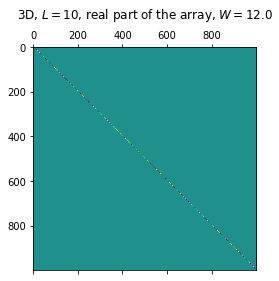

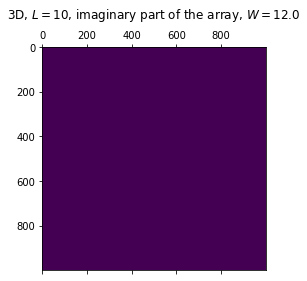

In [78]:
# size and dimensions

def build_ham(L=30, dim=2, W=5., hopping=1., phi=0., ):

    pbc = np.ones(dim, dtype=np.complex128)
    pbc[-1] = np.exp(1j*phi)


    fields = np.random.uniform(-W, W, tuple(L for i in range(dim)))
    parallel=False,

    # define the Hamiltonian 
    and_ham= ham(L, dim, hopping, fields, pbc, dtype=np.complex128)
    
    return and_ham, fields

L=10
dim=3
W=12.
and_ham, fields = build_ham(L=L, dim=dim, W=12.)
# display the hamiltonian
#fig=plt.figure()
#plt.clf()
plt.matshow(np.real(and_ham.mat.todense()))
plt.title(f'{dim}D, $L={L}$, real part of the array, $W={W}$', y=1.1)
#plt.show()

#fig = plt.figure()
#plt.clf()
plt.matshow(np.imag(and_ham.mat.todense()))
plt.title(f'{dim}D, $L={L}$, imaginary part of the array, $W={W}$', y=1.1)
#plt.show()


#eigvals, eigvecs = and_ham.eigsystem(complex=True)
#eig2 = h2.eigvals(complex=True)

#print(eig1-eig2)
#plt.plot(eig1-eig2)

### Diagonalization, find eigenvalues, eigenvectors and matrix elements

#### Explanation

To extract the array of the matrix elements between eigenstates for the $\hat{n}_i = \hat{c}_i^\dagger\hat{c}_i$ operator at $i$-th site, we first need to extract the $i$-th row of the eigenvector arrays, since the eigenvectors are given as the columns of the said array as per ```scipy``` [documentation](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.linalg.eigh.html). To obtain the array, we perform a tensor product operation. In our case, we select our site to be located at the center of the array.

#### Operators to be calculated:

##### Local density
$\langle \alpha|\hat{n}_i|\beta\rangle =\langle 0 |\sum_{j,k} \tilde{\alpha}^*_j\tilde{\beta}_k \hat{c}_j\hat{n}_i\hat{c}_k^\dagger|0\rangle = \tilde{\alpha}_i^*\tilde{\beta}_i$

##### Hopping
To obtain the hopping matrix elements, we also extract the $i+m$ row of the eigenvector array. We then take the tensor product of the $i$-th and $(i+m)$-th row and add its conjugate (we also need to ensure all the conjugations in the tensor product are accounted for).

$\langle \alpha|\hat{h}_i^{(m)}|\beta\rangle = \langle \alpha|\hat{c}_i^\dagger\hat{c}_{i+m} + \hat{c}_{i+m}^\dagger\hat{c}_i|\beta\rangle = \tilde{\alpha}^*_{i}\tilde{\beta}_{i+m} + \tilde{\alpha}_{i+m}^*\tilde{\beta}_i$

In [46]:
eigvals, eigvecs = and_ham.eigsystem(complex=True)

# coordinates of the density operator
dens_coords = np.array([0.5*L for i in range(dim)], dtype=np.uint64)
#print coordinates
print(f'Your selected density operator acts on the site: {dens_coords}')
# get index of the state in the Hamiltonian basis
dimensions = np.array([and_ham.L for i in range(and_ham.dim)], dtype=np.uint64)
dens_idx = get_idx(dens_coords, dimensions)
print(f'Site on which the  density operator acts corresponds to the basis state with index {dens_idx}')
#print the index
dens_coeffs = eigvecs[dens_idx, :]

#coordinates for hopping along the axis along which the boundary conditions are changed
hop_coords = dens_coords.copy()
hop_coords[-1] += -1
hop_idx = get_idx(hop_coords, dimensions)

hop_coeffs = eigvecs[[dens_idx, hop_idx],:]


print(f'Hoppings relate basis states {dens_idx} and {hop_idx}')

Your selected density operator acts on the site: [15 15]
Site on which the  density operator acts corresponds to the basis state with index 465
Hoppings relate basis states 465 and 435


In [47]:
matelts_dens = np.tensordot(dens_coeffs.conj(), dens_coeffs, axes=0)
matelts_hop = np.tensordot(hop_coeffs[0], hop_coeffs[1].conj(), axes=0)
matelts_hop += matelts_hop.conj()

### Densities

Text(0, 0.5, '$\\alpha$')

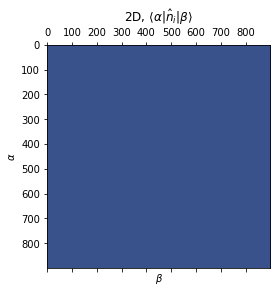

In [48]:
#fig = plt.figure()
plt.matshow(np.real(matelts_dens))
plt.title(f'{dim}D, $\\langle \\alpha|\\hat{{n}}_i |\\beta\\rangle$', y=1.08)
plt.xlabel('$\\beta$')
plt.ylabel('$\\alpha$')
#plt.show()

### Hoppings

Text(0, 0.5, '$\\alpha$')

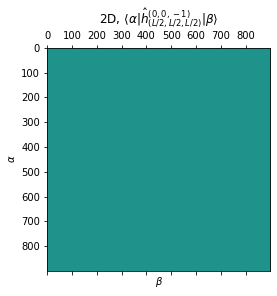

In [49]:
#fig = plt.figure()
plt.matshow(np.real(matelts_hop))
plt.title(f'{dim}D, $\\langle \\alpha|\\hat{{h}}_{{(L/2, L/2, L/2)}}^{{(0, 0, -1)}} |\\beta\\rangle$', y=1.08)
plt.xlabel('$\\beta$')
plt.ylabel('$\\alpha$')
#plt.show()

### Wavefunctions in the central plane

Here, we provide two animations showing the eigenfunctions for the 2D model in the low and high disorder cases. Each frame
in the corresponding animations displays one eigenfunction.


In [79]:
from matplotlib import animation, rc
from IPython.display import HTML
rc('animation', html='jshtml')

def animate(i, im, eigvecs, ax, L, dim, W):
    
    lattice = (L for i in range(dim))
    eigvec = eigvecs[:, i].reshape(*lattice)
    im.set_data(np.abs(eigvec)**2)
    ax.set_title(f'Eigenstate number {i}, $W={W}, t={hopping}$, lattice size: ${L}^{{{dim}}}$',
                fontsize=14)
    return (im,)





def make_animation(dim, L, W, phi=0.):
    
    and_ham, fields = build_ham(dim=dim, L=L, W=W, phi=phi)
    
    eigvals, eigvecs = and_ham.eigsystem(complex=True)
    fig, ax = plt.subplots(figsize=(10, 10))
    
    lattice = [L for i in range(dim)]
    im = ax.matshow(np.abs(eigvecs[:, 0].reshape(*lattice))**2,
                    aspect='auto')
    
    anim = animation.FuncAnimation(fig, animate,
                                   fargs=(im, eigvecs,
                                          ax, L, dim, W),
                                   frames=eigvecs.shape[1],
                                   interval=200, blit=True,
                                   repeat=False,
                                   cache_frame_data=False)    


    #HTML(anim.to_jshtml())
    
    return eigvals, eigvecs, HTML(anim.to_jshtml())


Calculating nnz, o_nnz, d_nnz!
Calculating nnz, o_nnz, d_nnz finished!


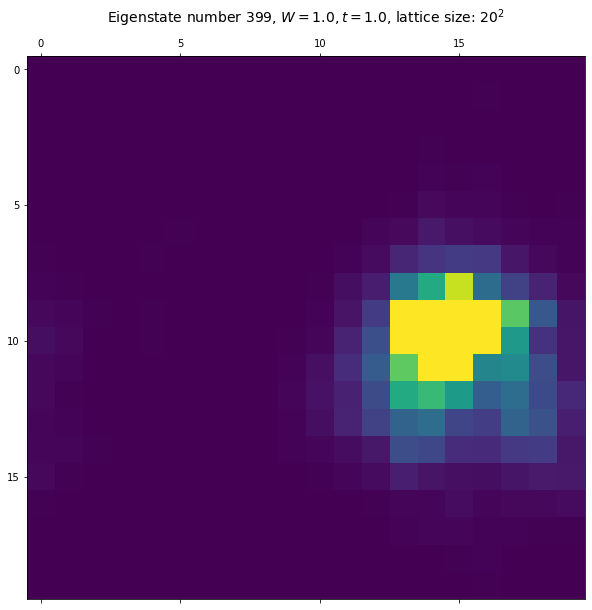

In [81]:
eigvls_lo, eigvcs_lo, anim_lo = make_animation(2, 20, 1.)
anim_lo

Calculating nnz, o_nnz, d_nnz!
Calculating nnz, o_nnz, d_nnz finished!


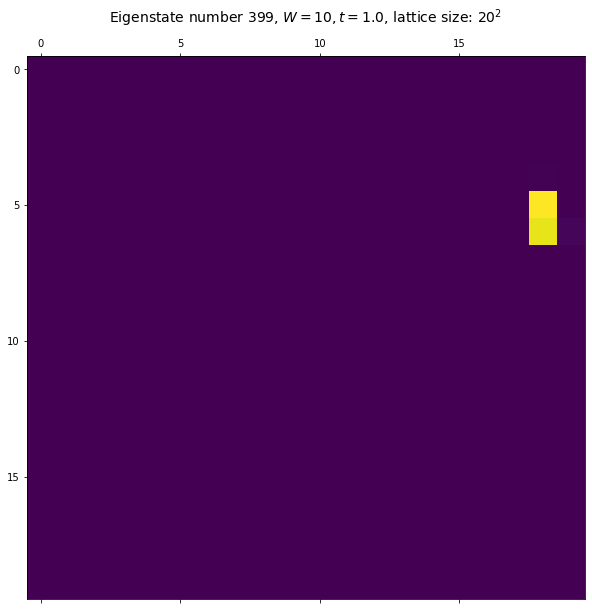

In [83]:
eigvls_hi, eigvcs_hi, anim_hi = make_animation(2, 20, 10)
anim_hi